# **Training Steps**

Import necessary libraries

In [7]:
import pandas as pd
import numpy as np
import os
import pickle
import multiprocessing
from multiprocessing.pool import ThreadPool
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import keras
from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers, Model, Sequential
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dropout, Dense, Activation
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from prettytable import PrettyTable
import seaborn as sns

After defining and running the load_data function, two DataFrames df_train and df_test are created, which hold the loaded and preprocessed training and testing data, respectively. 

In [3]:
# Function to load and preprocess data
def load_data():
    train = pd.read_csv('../project/train.csv')
    test = pd.read_csv('../project/test.csv')
    
    train_dir = '../project/processed_images/'
    test_dir = '../project/test_images/'

    train['file_path'] = train['id_code'].apply(lambda x: os.path.join(train_dir, f'processed_{x}.png'))
    test['file_path'] = test['id_code'].apply(lambda x: os.path.join(test_dir, f'{x}.png'))
    
    train['file_name'] = train["id_code"].apply(lambda x: f'processed_{x}.png')
    test['file_name'] = test["id_code"].apply(lambda x: f'{x}.png')
    
    train['diagnosis'] = train['diagnosis'].astype(str)
    
    return train, test

df_train,df_test = load_data()
print(df_train.shape,df_test.shape,'\n')
df_train.head(6)

(3662, 4) (1928, 3) 



,id_code,diagnosis,file_path,file_name
0,000c1434d8d7,2,../project/processed_images/processed_000c1434...,processed_000c1434d8d7.png
1,001639a390f0,4,../project/processed_images/processed_001639a3...,processed_001639a390f0.png
2,0024cdab0c1e,1,../project/processed_images/processed_0024cdab...,processed_0024cdab0c1e.png
3,002c21358ce6,0,../project/processed_images/processed_002c2135...,processed_002c21358ce6.png
4,005b95c28852,0,../project/processed_images/processed_005b95c2...,processed_005b95c28852.png
5,0083ee8054ee,4,../project/processed_images/processed_0083ee80...,processed_0083ee8054ee.png


Spliting training data into two sets: one for training the model and another for validating it. Allocating 20% of the data to the validation set and the remaining 80% to the training set.

In [4]:
# Load data and display dataset shapes
df_train_train, df_train_valid = train_test_split(df_train, test_size=0.2)
print(df_train_train.shape,df_train_valid.shape)

(2929, 4) (733, 4)


In [6]:
# Function to plot class distribution in a dataset
def plot_classes(df,title):
    df_group = pd.DataFrame(df.groupby('diagnosis').agg('size').reset_index())
    df_group.columns = ['diagnosis','count']

    sns.set(rc={'figure.figsize':(10,5)}, style = 'whitegrid')
    sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")
    plt.title('Class Distribution ' + str(title))
    plt.show() 

Visualize class distribution in training and validation datasets


/home/coder/tmp/ipykernel_181/4237171176.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


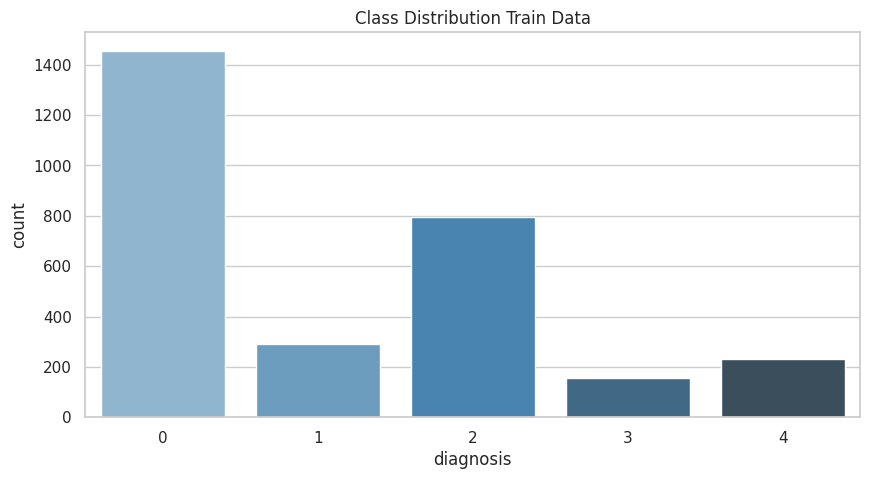

In [7]:
plot_classes(df_train_train,"Train Data")

/home/coder/tmp/ipykernel_181/4237171176.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


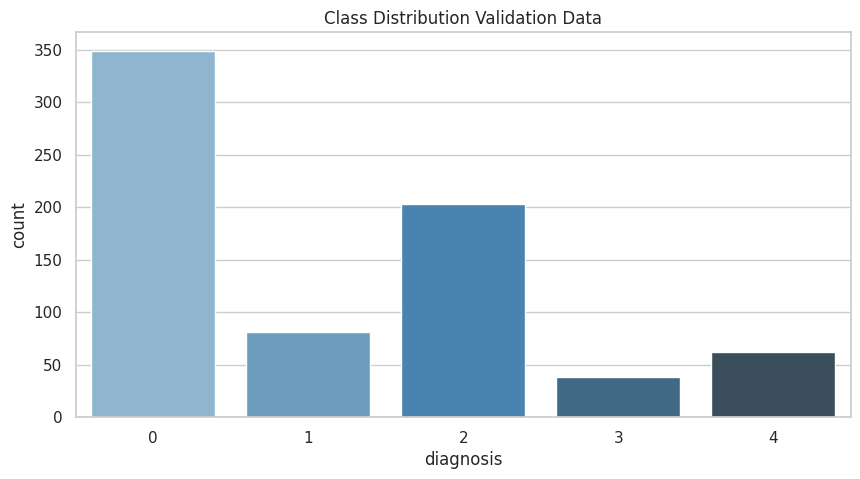

In [8]:
plot_classes(df_train_valid,'Validation Data')


In [9]:

df_train_train,df_train_test = load_data()
print(df_train_train.shape,df_train_test.shape,'\n')
df_train_train.head(6)

(3662, 4) (1928, 3) 



,id_code,diagnosis,file_path,file_name
0,000c1434d8d7,2,../project/processed_images/processed_000c1434...,processed_000c1434d8d7.png
1,001639a390f0,4,../project/processed_images/processed_001639a3...,processed_001639a390f0.png
2,0024cdab0c1e,1,../project/processed_images/processed_0024cdab...,processed_0024cdab0c1e.png
3,002c21358ce6,0,../project/processed_images/processed_002c2135...,processed_002c21358ce6.png
4,005b95c28852,0,../project/processed_images/processed_005b95c2...,processed_005b95c28852.png
5,0083ee8054ee,4,../project/processed_images/processed_0083ee80...,processed_0083ee8054ee.png


In [10]:

train_df = pd.read_csv('../project/train.csv')
train_df['diagnosis'] = train_df['diagnosis'].astype('str')
train_df['id_code'] = train_df['id_code'].apply(lambda x: f'processed_{x}.png')
num_classes = len(np.unique(train_df['diagnosis']))


In [11]:
# Define global variables for model configuration
BATCH_SIZE = 8
EPOCHS = 40
WARMUP_EPOCHS = 2
LEARNING_RATE = 1e-4
WARMUP_LEARNING_RATE = 1e-3
HEIGHT = 240
WIDTH = 240
CANAL = 3
N_CLASSES = train_df['diagnosis'].nunique()
ES_PATIENCE = 5
RLROP_PATIENCE = 3
DECAY_DROP = 0.5


The img_generator function initializes image data generators for augmenting and pre-processing training, validation, and test image data, then creates iterable generators from dataframes that supply the images in batches to the neural network during training and evaluation.

In [139]:

def img_generator(train, valid, test):
    train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True)
    test_datagen = ImageDataGenerator(rescale=1./255) 

    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train,
        directory=None,  # Using absolute paths
        x_col="file_path",
        y_col="diagnosis",
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        target_size=(HEIGHT, WIDTH)
    )

    valid_generator = train_datagen.flow_from_dataframe(
        dataframe=valid,
        directory=None,
        x_col="file_path",
        y_col="diagnosis",
        batch_size=BATCH_SIZE,
        class_mode="categorical",    
        target_size=(HEIGHT, WIDTH)
    )

    test_generator = test_datagen.flow_from_dataframe(
        dataframe=test,
        directory=None,  # Using absolute paths
        x_col="file_path",
        batch_size=1,
        shuffle=False,  
        class_mode=None,  
        target_size=(HEIGHT, WIDTH)
    )

    return train_generator, valid_generator, test_generator

train_generator, valid_generator, test_generator = img_generator(df_train_train, df_train_valid, df_test)


Found 3662 validated image filenames belonging to 5 classes.
Found 733 validated image filenames belonging to 5 classes.
Found 1928 validated image filenames.


The create_model function builds a customizable image classification model using the ResNet50 architecture as its foundation. Starting with an input layer that matches the specified image dimensions, it incorporates ResNet50 without its top layer or pre-trained weights to allow for flexibility. To address overfitting, the model includes dropout layers that randomly deactivate neurons during training. It also features a dense layer with ReLU activation for complex feature learning, and concludes with a softmax output layer for classifying the images into multiple categories. 

In [140]:
def create_model(input_shape, n_out):
    input_tensor = Input(shape=input_shape)
    base_model = applications.ResNet50(weights=None, include_top=False,input_tensor=input_tensor)

    x = GlobalAveragePooling2D()(base_model.output)
    x = Dropout(0.5)(x)
    x = Dense(2048, activation='relu')(x)
    x = Dropout(0.5)(x)
    final_output = Dense(n_out, activation='softmax', name='final_output')(x)
    model = Model(input_tensor, final_output)
    return model

In [141]:

model = create_model(input_shape=(HEIGHT, WIDTH, CANAL), n_out=N_CLASSES)
model.summary()


Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 246, 246, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 120, 120, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [142]:

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
print(STEP_SIZE_TRAIN,STEP_SIZE_VALID)

457 91


The model is compiled with the Adam optimizer, using a warm-up learning rate, and the categorical cross-entropy loss function, suitable for multi-class classification.  The model is first trained for a few epochs (WARMUP_EPOCHS) to stabilize the parameters from the randomly initialized state.


In [143]:
model.compile(optimizer = optimizers.Adam(learning_rate=WARMUP_LEARNING_RATE),loss = 'categorical_crossentropy',metrics = ['accuracy'])

history_warmup = model.fit(train_generator,
                            steps_per_epoch=STEP_SIZE_TRAIN,
                            validation_data=valid_generator,validation_steps=STEP_SIZE_VALID,
                            epochs=WARMUP_EPOCHS,
                            verbose=1).history

Epoch 1/2
457/457 [==============================] - 25s 42ms/step - loss: 1.6927 - accuracy: 0.6190 - val_loss: 1.6781 - val_accuracy: 0.2953
Epoch 2/2
457/457 [==============================] - 18s 39ms/step - loss: 0.9042 - accuracy: 0.6954 - val_loss: 0.8152 - val_accuracy: 0.7033


Allows fine-tuning of all layers instead of just the top layers added, which adapts the pre-trained features. The model is trained for additional epochs with all layers trainable.

Using 'binary_crossentropy' beacause, labels are in binary format.

In [144]:

for layer in model.layers:
        layer.trainable = True

        es = EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
        rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

        callback_list = [es, rlrop]
        optimizer = optimizers.Adam(lr=LEARNING_RATE)
        model.compile(optimizer=optimizer, loss="binary_crossentropy",  metrics=['accuracy'])
        model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 240, 240, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 246, 246, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 120, 120, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

 conv4_block4_3_bn (BatchNormal  (None, 15, 15, 1024  4096       ['conv4_block4_3_conv[0][0]']    
 ization)                       )                                                                 
                                                                                                  
 conv4_block4_add (Add)         (None, 15, 15, 1024  0           ['conv4_block3_out[0][0]',       
                                )                                 'conv4_block4_3_bn[0][0]']      
                                                                                                  
 conv4_block4_out (Activation)  (None, 15, 15, 1024  0           ['conv4_block4_add[0][0]']       
                                )                                                                 
                                                                                                  
 conv4_block5_1_conv (Conv2D)   (None, 15, 15, 256)  262400      ['conv4_block4_out[0][0]']       
          

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 ization)                                                                                         
                                                                                                  
 conv5_block1_3_bn (BatchNormal  (None, 8, 8, 2048)  8192        ['conv5_block1_3_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block1_add (Add)         (None, 8, 8, 2048)   0           ['conv5_block1_0_bn[0][0]',      
                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_blo

In [145]:

history_finetunning = model.fit(train_generator,
                                steps_per_epoch=STEP_SIZE_TRAIN,
                                validation_data=valid_generator,
                                validation_steps=STEP_SIZE_VALID,
                                epochs=EPOCHS,
                                callbacks=callback_list,
                                verbose=1).history

Epoch 1/40
457/457 [==============================] - 26s 44ms/step - loss: 0.2933 - accuracy: 0.7115 - val_loss: 0.2453 - val_accuracy: 0.7280 - lr: 1.0000e-04
Epoch 2/40
457/457 [==============================] - 20s 44ms/step - loss: 0.2796 - accuracy: 0.7118 - val_loss: 0.2435 - val_accuracy: 0.7253 - lr: 1.0000e-04
Epoch 3/40
457/457 [==============================] - 19s 41ms/step - loss: 0.2732 - accuracy: 0.7146 - val_loss: 0.2485 - val_accuracy: 0.7184 - lr: 1.0000e-04
Epoch 4/40
457/457 [==============================] - 19s 41ms/step - loss: 0.2674 - accuracy: 0.7159 - val_loss: 0.2846 - val_accuracy: 0.6978 - lr: 1.0000e-04
Epoch 5/40
457/457 [==============================] - 19s 41ms/step - loss: 0.2627 - accuracy: 0.7200 - val_loss: 0.2344 - val_accuracy: 0.7294 - lr: 1.0000e-04
Epoch 6/40
457/457 [==============================] - 18s 39ms/step - loss: 0.2613 - accuracy: 0.7198 - val_loss: 0.2500 - val_accuracy: 0.7170 - lr: 1.0000e-04
Epoch 7/40
457/457 [==============

In [ ]:
#saving the model
model.save('resNet-model.h5')

# **Model Performance**

## 1. Plotting Model Accuracy and Loss

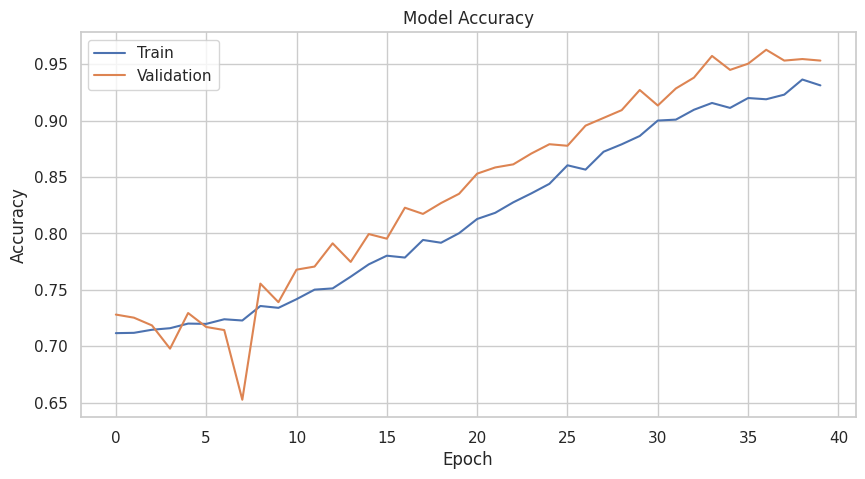

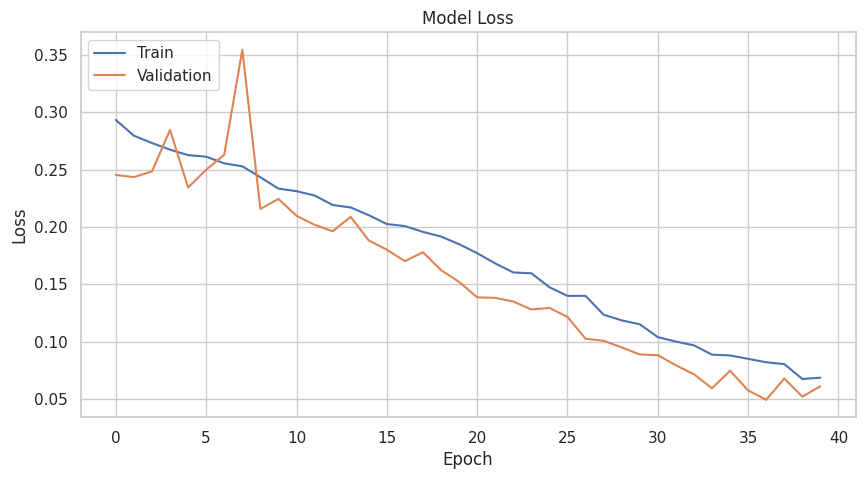

In [147]:
import matplotlib.pyplot as plt

# Summarize history for accuracy
plt.plot(history_finetunning['accuracy'])
plt.plot(history_finetunning['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Summarize history for loss
plt.plot(history_finetunning['loss'])
plt.plot(history_finetunning['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

## 2. Predicting and Evaluating Model on Training Data


This section sets up an image data generator for processing images in batches without augmentation, predicts the classes for these images, and calculates the Cohen Kappa score and accuracy to evaluate model performance

In [148]:

from sklearn.metrics import confusion_matrix, cohen_kappa_score,accuracy_score

complete_datagen = ImageDataGenerator(rescale=1./255)
complete_generator = complete_datagen.flow_from_dataframe(
    dataframe=df_train_train,  
    directory="./processed_images/",
    x_col="file_name",
    target_size=(HEIGHT, WIDTH),
    batch_size=1,
    shuffle=False,
    class_mode=None
)

# Calculating the number of steps
STEP_SIZE_COMPLETE = complete_generator.n // complete_generator.batch_size

# Making predictions
train_preds = model.predict(complete_generator, steps=STEP_SIZE_COMPLETE, verbose=1)
train_preds = [np.argmax(pred) for pred in train_preds]


Found 3662 validated image filenames.
3662/3662 [==============================] - 36s 10ms/step


In [149]:
print("Train Cohen Kappa score: %.3f" % cohen_kappa_score(train_preds, df_train_train['diagnosis'].astype('int'), weights='quadratic'))
print("Train Accuracy score : %.3f" % accuracy_score(df_train_train['diagnosis'].astype('int'),train_preds))

Train Cohen Kappa score: 0.978
Train Accuracy score : 0.960


## 3. Confusion Matrix Visualization
Shows how predictions compare against true labels, providing insight into where the model is making errors.

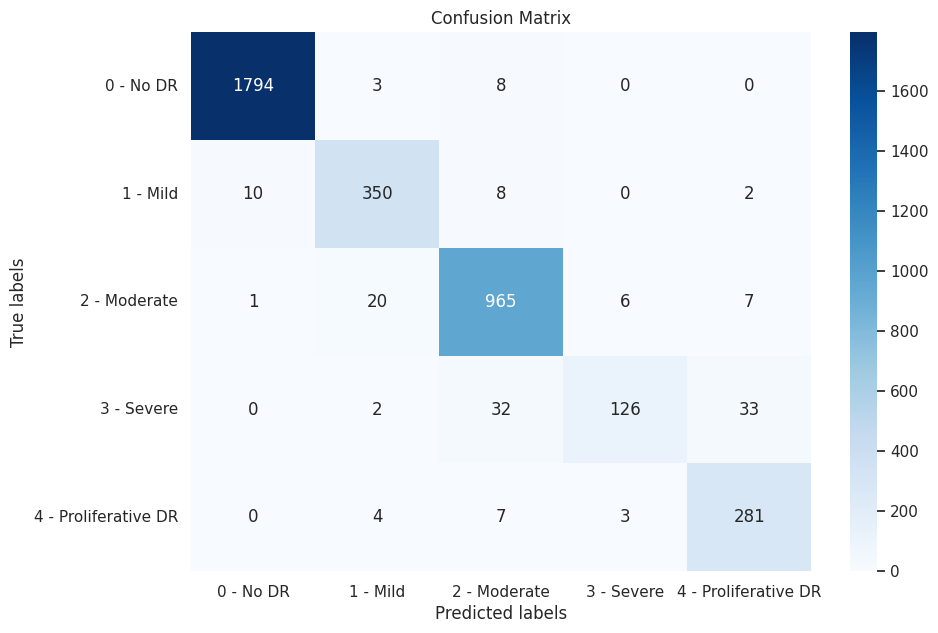

In [150]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

true_labels = df_train_train['diagnosis'].astype('int').values

# predicted labels are already stored in `train_preds`

# Calculate the confusion matrix
cf_matrix = confusion_matrix(true_labels, train_preds)

# Plot the confusion matrix
labels = ['0 - No DR', '1 - Mild', '2 - Moderate', '3 - Severe', '4 - Proliferative DR']
df_cm = pd.DataFrame(cf_matrix, index=labels, columns=labels)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


## 4. Single Image Prediction
This final part loads a single image, preprocesses it, and uses the trained model to make a prediction:



In [11]:
import keras.utils as image
import numpy as np
from keras import models    

model = models.load_model('./resNet-model.h5') 

img_path = './processed_images/processed_001639a390f0.png'
img = image.load_img(img_path, target_size=(240, 240))  
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions, axis=1)

# Output the predicted class
print(f"The uploaded image is predicted to be in class: {predicted_class}")

1/1 [==============================] - 1s 741ms/step
The uploaded image is predicted to be in class: [2]


1/1 [==============================] - 1s 705ms/step


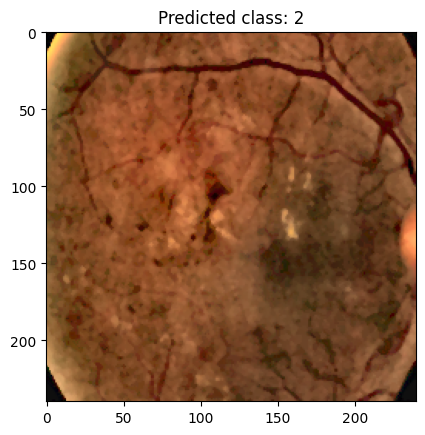

The uploaded image is predicted to be in class: 2


In [10]:
import cv2
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
import matplotlib.pyplot as plt

def preprocess_single_image(image_path):
    """
    Preprocess a single image according to the specified steps.
    """
    img = cv2.imread(image_path)
    if img is None:
        print(f"Skipping file {image_path}, unable to read.")
        return None
    img = cv2.resize(img, (240, 240))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

    # Copying for grayscale conversion, blurring, and thresholding
    copy = img.copy()
    copy = cv2.cvtColor(copy, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(copy, (5, 5), 0)
    thresh = cv2.threshold(blur, 10, 255, cv2.THRESH_BINARY)[1]

    # Contour detection and cropping based on the contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours or len(contours) == 0:
        print("No contours found.")
        return None

    # Assuming the largest contour is the target object
    contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(contour)

    if w > 100 and h > 100:
        x_crop_margin = int(w * 4 // 50)
        y_crop_margin = int(h * 5 // 50)
        cropped_img = img[max(0, y + y_crop_margin):min(y + h - y_crop_margin, img.shape[0]),
                          max(0, x + x_crop_margin):min(x + w - x_crop_margin, img.shape[1])]
        img = cv2.resize(cropped_img, (240, 240))

    # LAB color space conversion for CLAHE
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    merged = cv2.merge((cl, a, b))
    final_img = cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)

    # Apply median blur and subtract the background
    med_blur = cv2.medianBlur(final_img, 3)
    background = cv2.medianBlur(final_img, 37)
    mask = cv2.addWeighted(med_blur, 1, background, -1, 255)
    processed_img = cv2.bitwise_and(mask, med_blur)

    return processed_img

def predict_image(image_path, model):
    processed_img = preprocess_single_image(image_path)
    if processed_img is None:
        return "Image processing failed."

    # Prepare the image for prediction
    img_array = image.img_to_array(processed_img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize

    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions, axis=1)

    plt.imshow(processed_img) 
    plt.title(f"Predicted class: {predicted_class[0]}")
    plt.show()

    return f"The uploaded image is predicted to be in class: {predicted_class[0]}"

model_path = './resNet-model.h5'  
model = models.load_model(model_path)

image_path = './train_images/000c1434d8d7.png'
prediction_message = predict_image(image_path, model)
print(prediction_message)
